# Workshop 2: Online Shopping

### Goals
- Strengthen student knowledge in descriptive statistics
- Strengthen the knowledge acquired in machine learning techniques and algorithms.
- Generate skills in the use of modeling and programming tools for machine learning.

### Problem statement
Consider the data set "Online_Shopping", which corresponds to the purchase intention of customers of an online store.

---
## Data exploration
Load the dataset

In [103]:
import pandas as pd

df = pd.read_csv("/content/Online_Shopping.csv", sep=';', decimal=",")
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12316 non-null  float64
 1   Administrative_Duration  12316 non-null  float64
 2   Informational            12316 non-null  float64
 3   Informational_Duration   12316 non-null  float64
 4   ProductRelated           12316 non-null  float64
 5   ProductRelated_Duration  12316 non-null  float64
 6   BounceRates              12316 non-null  float64
 7   ExitRates                12316 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

Describe each variable (maximum, minimum, average, standard deviation, distribution). 

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Administrative,12316.0,2.317798,3.322754,0.0,0.000000,1.000000,4.000000,27.000000
Administrative_Duration,12316.0,80.906176,176.860432,-1.0,0.000000,8.000000,93.500000,3398.750000
Informational,12316.0,0.503979,1.270701,0.0,0.000000,0.000000,0.000000,24.000000
Informational_Duration,12316.0,34.506387,140.825479,-1.0,0.000000,0.000000,0.000000,2549.375000
ProductRelated,12316.0,31.763884,44.490339,0.0,7.000000,18.000000,38.000000,705.000000
ProductRelated_Duration,12316.0,1196.037057,1914.372511,-1.0,185.000000,599.766190,1466.479902,63973.522230
BounceRates,12316.0,0.022152,0.048427,0.0,0.000000,0.003119,0.016684,0.200000
ExitRates,12316.0,0.043003,0.048527,0.0,0.014286,0.025124,0.050000,0.200000
PageValues,12330.0,5.889258,18.568437,0.0,0.000000,0.000000,0.000000,361.763742
SpecialDay,12330.0,0.061427,0.198917,0.0,0.000000,0.000000,0.000000,1.000000


With pandas profiling we obtain a plot of the distribution of each variable and also with respect to the class variable (Revenue). The correlation matrix heatmap is also generated.

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

from pandas_profiling import ProfileReport

profile = ProfileReport(df, title='Online Shopping', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Use of [Label Encoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html) for boolean variables.

The variable ``VisitorType`` has 3 categories: ``Returning_Visitor``, ``New_Visitor`` and ``Other``. Since only 0.7% of the entries has ``Other`` label, the use of One Hot Encoder is dismissed and regular label encoding is applied.

In [104]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder() 
df['Weekend'] = le.fit_transform(df['Weekend'])
df['Revenue'] = le.fit_transform(df['Revenue'])
df['VisitorType'] = le.fit_transform(df['VisitorType'])
df.head(10)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.0,0.0,Feb,1,1,1,1,2,0,0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,0.0,Feb,2,2,1,2,2,0,0
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.200000,0.200000,0.0,0.0,Feb,4,1,9,3,2,0,0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.0,0.0,Feb,3,2,2,4,2,0,0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,0.0,Feb,3,3,1,4,2,1,0
5,0.0,0.0,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.0,0.0,Feb,2,2,1,3,2,0,0
6,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.200000,0.200000,0.0,0.4,Feb,2,4,3,3,2,0,0
7,1.0,-1.0,0.0,-1.0,1.0,-1.000000,0.200000,0.200000,0.0,0.0,Feb,1,2,1,5,2,1,0
8,0.0,0.0,0.0,0.0,2.0,37.000000,0.000000,0.100000,0.0,0.8,Feb,2,2,2,3,2,0,0
9,0.0,0.0,0.0,0.0,3.0,738.000000,0.000000,0.022222,0.0,0.4,Feb,2,4,1,2,2,0,0


Use of [One Hot Encoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html) for categorical features.

After One Hot Encoder is applied, the number of features increase from 18 (including the class) to 73.

In [105]:
from sklearn.preprocessing import OneHotEncoder

# Creating instance of one-hot-encoder
enc = OneHotEncoder(handle_unknown='ignore')
# Variables to encode
enc_df = pd.DataFrame(enc.fit_transform(df[['Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType']]).toarray())
# Merge with main df on key values
df = df.join(enc_df)
#Drop old columns
df = df.drop(['Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType'], axis=1)
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,50,51,52,53,54,55,56,57,58,59
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.200000,0.200000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Split the dataframe into X and y, since we are trying to find a model that represent $y=f(X)$. In this case, the class variable y is ``Revenue``.

In [106]:
import numpy as np

# Need to drop NaN and convert to float32 datatype in order to use ExtraTreesClassifier
tmp_df = df.dropna().astype(np.float32)

y = tmp_df[['Revenue']]
X = tmp_df.drop(['Revenue'], axis=1)

## Feature selection
### Remove unnecessary attributes
From [User Guide: Selection from model](https://scikit-learn.org/stable/modules/feature_selection.html#select-from-model): Tree-based estimators can be used to compute impurity-based feature importances, which in turn can be used to discard irrelevant features (when coupled with the SelectFromModel meta-transformer).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  import sys



Features importance:


Features selected:

Index([         'Administrative', 'Administrative_Duration',
                 'Informational',  'Informational_Duration',
                'ProductRelated', 'ProductRelated_Duration',
                   'BounceRates',               'ExitRates',
                    'PageValues',             'VisitorType',
                       'Weekend',                         7,
                              31,                        33],
      dtype='object')


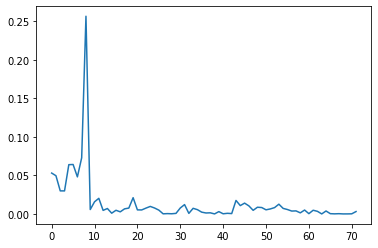

In [107]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from matplotlib import pyplot as plt
%matplotlib inline

clf = ExtraTreesClassifier(n_estimators=100, random_state=0)
clf.fit(X, y)

print("\nFeatures importance:\n")
plt.plot(clf.feature_importances_ )

model = SelectFromModel(clf, prefit=True)
selected_feat = X.columns[(model.get_support())]

print("\nFeatures selected:\n")
print(selected_feat)

### Remove low variance attributes

First we standardize features by removing the mean and scaling to unit variance.

In [108]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
print(scaler.fit(X))
Xstd = scaler.transform(X)
Xstd = pd.DataFrame(Xstd)
Xstd.describe().transpose()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


StandardScaler()


,count,mean,std,min,25%,50%,75%,max
0,12316.0,2.327848e-06,1.000011,-0.697582,-0.697582,-0.396614,0.506288,7.428538
1,12316.0,-1.382945e-06,1.000025,-0.463131,-0.457476,-0.412241,0.071211,18.760433
2,12316.0,-3.171528e-06,1.000009,-0.396631,-0.396631,-0.396631,-0.396631,18.491344
3,12316.0,-3.015053e-07,1.000000,-0.252141,-0.245039,-0.245039,-0.245039,17.858776
4,12316.0,-2.501062e-07,1.000035,-0.713979,-0.556635,-0.309381,0.140174,15.132802
...,...,...,...,...,...,...,...,...
67,12316.0,-4.731288e-07,0.999944,-0.015609,-0.015609,-0.015609,-0.015609,64.065071
68,12316.0,6.168309e-07,1.000009,-0.009011,-0.009011,-0.009011,-0.009011,110.972969
69,12316.0,1.203507e-06,1.000096,-0.028506,-0.028506,-0.028506,-0.028506,35.079910
70,12316.0,-2.169478e-06,0.999915,-0.037178,-0.037178,-0.037178,-0.037178,26.897408


In [109]:
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold()
sel.fit_transform(Xstd)

selected_feat = Xstd.columns[sel.get_support()]

print("\nFeatures selected:\n")
print(selected_feat)


Features selected:

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
            68, 69, 70, 71],
           dtype='int64')


### Analyse high correlation between variables
From the correlation matrix, we conclude that, for example, the variable ``Administrative`` is highly correlated with the variable ``Administrative_Duration``. Same with the analogous ``Informational`` and ``ProductRelated``. We remove those features by hand.

In [90]:
X = X.drop(['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration'], axis=1)

Then we use mutual information and ANOVA F-value to obtain the k best features:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



Selected Features with mutual information:
Index([         'Administrative', 'Administrative_Duration',
                 'Informational',  'Informational_Duration',
                'ProductRelated', 'ProductRelated_Duration',
                   'BounceRates',               'ExitRates',
                    'PageValues',              'SpecialDay',
                               7,                        22,
                              25,                        41,
                              52],
      dtype='object')

Selected Features with ANOVA F-value:
Index([         'Administrative', 'Administrative_Duration',
                 'Informational',          'ProductRelated',
       'ProductRelated_Duration',             'BounceRates',
                     'ExitRates',              'PageValues',
                    'SpecialDay',             'VisitorType',
                               6,                         7,
                              12,                        41,
      

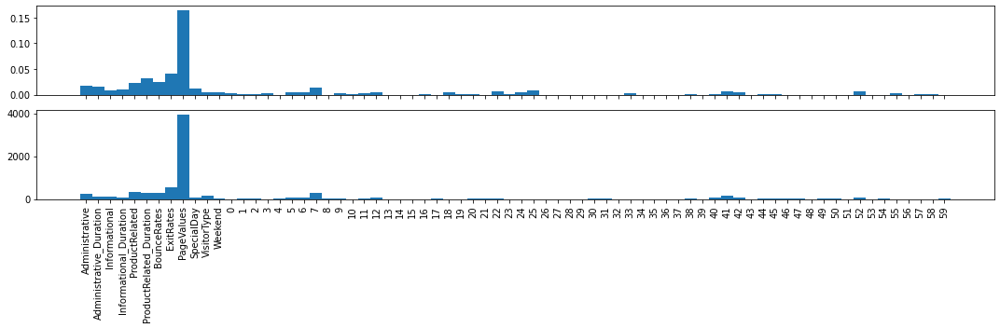

In [143]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif

plt.rcParams['figure.figsize'] = [15, 5]

# configure to select k features
fsm = SelectKBest(score_func=mutual_info_classif, k=15)
fsf = SelectKBest(score_func=f_classif, k=15)
# learn relationship from training data
fsm.fit(X, y)
fsf.fit(X, y)

#Selected features
cols_m = fsm.get_support(indices=True)
cols_f = fsf.get_support(indices=True)
attributes_m = X.columns[cols_m]
attributes_f = X.columns[cols_f]
print("\nSelected Features with mutual information:")
print(attributes_m)
print("\nSelected Features with ANOVA F-value:")
print(attributes_f)

# plot the scores for the features
fig, ax = plt.subplots(2, 1, sharex=True)
bar_m = ax[0].bar([i for i in range(len(fsm.scores_))], fsm.scores_, 1, label='mutual_info_classif')
bar_f = ax[1].bar([i for i in range(len(fsf.scores_))], fsf.scores_, 1, label='f_classif')
plt.xticks(range(X.shape[1]), X.columns,
           fontsize=10, rotation=90)
fig.tight_layout()

plt.show()

Final dataset:

In [144]:
X_classif = X[['Administrative', 'Informational', 'ProductRelated', 'BounceRates', 'ExitRates', 'PageValues', 'VisitorType', 'SpecialDay', 7, 41, 42]]

## Classification

First we split the whole dataset in subsets for trining and testing:

In [145]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_classif, y, test_size=0.33, random_state=1)

scaler = StandardScaler()
scaler.fit(X_train)
X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1692: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


The first model to train is with Logistic Regression:

In [146]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0, penalty='l2').fit(X_train_std, y_train)

clf_prediction = clf.predict(X_test_std)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


We evaluate the model obtained with Logistic Regression:


=====Confusion Matrix (Logistic Regression):=====

[[3325   70]
 [ 418  252]]

=====Classification Report (Logistic Regression):=====

              precision    recall  f1-score   support

         0.0       0.89      0.98      0.93      3395
         1.0       0.78      0.38      0.51       670

    accuracy                           0.88      4065
   macro avg       0.84      0.68      0.72      4065
weighted avg       0.87      0.88      0.86      4065


=====ROC Curve:=====



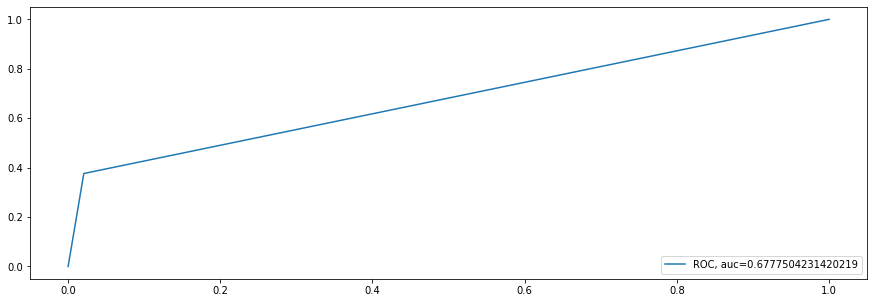

In [147]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

print("\n=====Confusion Matrix (Logistic Regression):=====\n")
print(confusion_matrix(y_test, clf_prediction))

print("\n=====Classification Report (Logistic Regression):=====\n")
print(classification_report(y_test, clf_prediction))

#Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test,  clf_prediction)
auc = roc_auc_score(y_test, clf_prediction)
plt.plot(fpr,tpr,label="ROC, auc="+str(auc))
plt.legend(loc=4)

print("\n=====ROC Curve:=====\n")

Next model to train is with decision trees:

In [148]:
from sklearn import tree

clf_dt = tree.DecisionTreeClassifier()
clf_dt = clf_dt.fit(X_train_std, y_train)

clf_dt_prediction = clf_dt.predict(X_test_std)

We evaluate the model obtained with decision trees:


=====Confusion Matrix (Decision Trees):=====

[[3099  296]
 [ 292  378]]

=====Classification Report (Decision Trees):=====

              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91      3395
         1.0       0.56      0.56      0.56       670

    accuracy                           0.86      4065
   macro avg       0.74      0.74      0.74      4065
weighted avg       0.86      0.86      0.86      4065


=====ROC Curve:=====



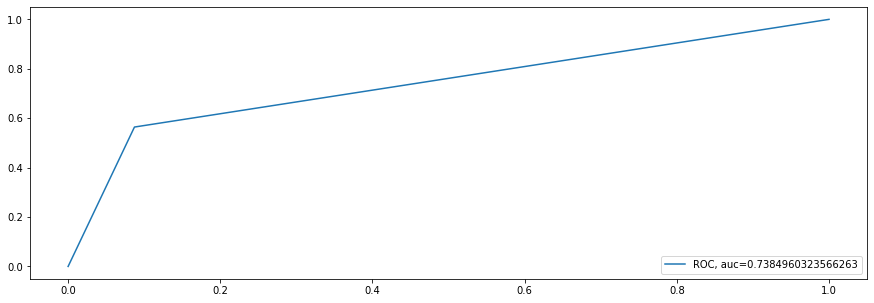

In [149]:
print("\n=====Confusion Matrix (Decision Trees):=====\n")
print(confusion_matrix(y_test, clf_dt_prediction))

print("\n=====Classification Report (Decision Trees):=====\n")
print(classification_report(y_test, clf_dt_prediction))

#Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test,  clf_dt_prediction)
auc = roc_auc_score(y_test, clf_dt_prediction)
plt.plot(fpr,tpr,label="ROC, auc="+str(auc))
plt.legend(loc=4)

print("\n=====ROC Curve:=====\n")

The third model to train use Random Forest:

In [150]:
from sklearn.ensemble import RandomForestClassifier

clf_rf = RandomForestClassifier(max_depth=10, random_state=0)
clf_rf = clf_rf.fit(X_train_std, y_train)

clf_rf_prediction = clf_rf.predict(X_test_std)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


We evaluate the model with Random Forest:


=====Confusion Matrix (Random Forest):=====

[[3269  126]
 [ 286  384]]

=====Classification Report (Random Forest):=====

              precision    recall  f1-score   support

         0.0       0.92      0.96      0.94      3395
         1.0       0.75      0.57      0.65       670

    accuracy                           0.90      4065
   macro avg       0.84      0.77      0.80      4065
weighted avg       0.89      0.90      0.89      4065


=====ROC Curve:=====



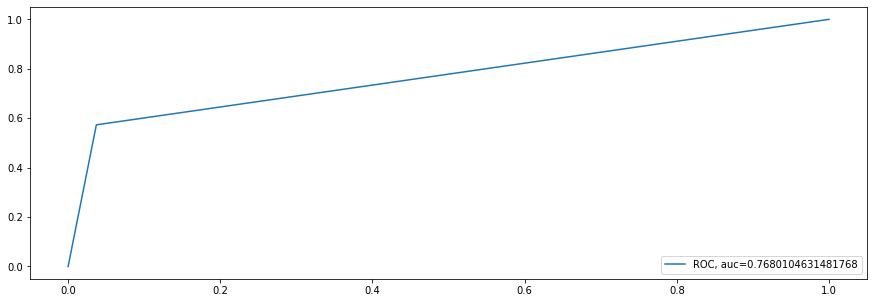

In [151]:
print("\n=====Confusion Matrix (Random Forest):=====\n")
print(confusion_matrix(y_test, clf_rf_prediction))

print("\n=====Classification Report (Random Forest):=====\n")
print(classification_report(y_test, clf_rf_prediction))

#Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test,  clf_rf_prediction)
auc = roc_auc_score(y_test, clf_rf_prediction)
plt.plot(fpr,tpr,label="ROC, auc="+str(auc))
plt.legend(loc=4)

print("\n=====ROC Curve:=====\n")

The last model to train is a Multi-layer Perceptron classifier.

In [152]:
from sklearn.neural_network import MLPClassifier

clf_mlp = MLPClassifier(hidden_layer_sizes=(100, 100), activation='tanh', solver='sgd') # solver stochastic gradient descent
clf_mlp = clf_mlp.fit(X_train_std, y_train)

clf_mlp_prediction = clf_mlp.predict(X_test_std)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


We evaluate the model based in a Multi-layer perceptron:


=====Confusion Matrix (Multi-layer perceptron):=====

[[3269  126]
 [ 318  352]]

=====Classification Report (Multi-layer perceptron):=====

              precision    recall  f1-score   support

         0.0       0.91      0.96      0.94      3395
         1.0       0.74      0.53      0.61       670

    accuracy                           0.89      4065
   macro avg       0.82      0.74      0.77      4065
weighted avg       0.88      0.89      0.88      4065


=====ROC Curve:=====



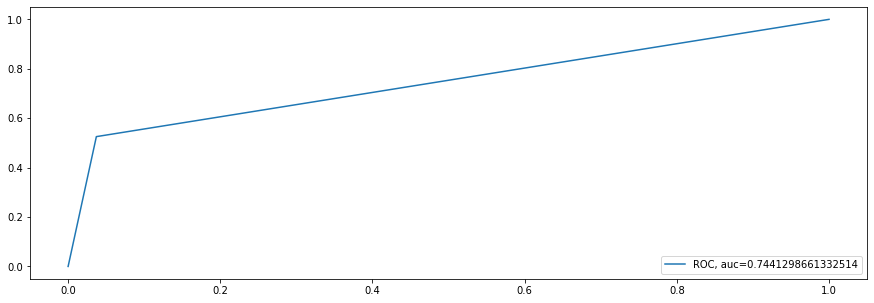

In [153]:
print("\n=====Confusion Matrix (Multi-layer perceptron):=====\n")
print(confusion_matrix(y_test, clf_mlp_prediction))

print("\n=====Classification Report (Multi-layer perceptron):=====\n")
print(classification_report(y_test, clf_mlp_prediction))

#Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test,  clf_mlp_prediction)
auc = roc_auc_score(y_test, clf_mlp_prediction)
plt.plot(fpr,tpr,label="ROC, auc="+str(auc))
plt.legend(loc=4)

print("\n=====ROC Curve:=====\n")